# Introduction: Business Problem 

In this project we will try to predict the monthly rental price for a condominium. Specifically, this report will be targeted to stakeholders interested in finding the best value in renting a condominium in Singapore.

We will use our data science powers to find optimum rental price and recommend stake holders the best values and similar units for the stakeholders.

# Important & Settings

In [1]:
#!pip install feature_engine

In [2]:
import pandas as pd
import numpy as np
from IPython.display import display

from feature_engine.encoding import OneHotEncoder as fe_OneHotEncoder
from feature_engine.encoding import RareLabelEncoder
import feature_engine.transformation as vt

from sklearn.feature_extraction.text import CountVectorizer


import matplotlib
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

from scipy import stats
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform

import folium
from folium.plugins import MarkerCluster
import branca


import geojson

import seaborn as sns

import pickle

In [3]:
#pandas setting
pd.set_option('max_columns', None)

#global rng
rng = np.random.RandomState(1)

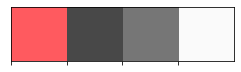

In [4]:
#colour template

pink = '#FF5A5F'
light_black = '#484848'
grey = '#767676'
background_color = "#fafafa"
face_color = '#fafafa'

sns.palplot([pink, light_black, grey, background_color])

# Exploratory Data Analysis

In [5]:
df_train = pd.read_pickle('Data/df_train')
df_train.head(2)

,detailed_address,lat,long,bedrooms,bathrooms,sqft,built_year,amenities,mrt_name,building_name,tenure,link,picture_url,price_month,walking_time,distance,studio,district_number
6152,9 Cairnhill Road,1.302997,103.837785,2.0,2.0,1044,2017.0,"[Clubhouse, Spa pavilion, Swimming pool, Wadin...",Somerset MRT,Cairnhill Nine,0,https://www.99.co/singapore/rent/property/cair...,https://pic.99.co/v3/GY7heYcWrkJDc4CAbTzxg8?wi...,7000,10.0,416.0,0,9
2957,16 Enggor Street,1.274241,103.844755,1.0,1.0,603,2014.0,"[Clubhouse, Basketball court, Aircon, Gym, Bed...",Tanjong Pagar MRT,Altez,0,https://www.99.co/singapore/rent/property/alte...,https://pic.99.co/v3/VDpWSjpLfgjqVFNKaPt8Pg?wi...,4500,5.0,253.0,0,2


## Categorical Data

### Amenities

We will first investigate if there is a price different in terms of number of amenities count

In [6]:
df_train['amenities_count'] = df_train.amenities.apply(lambda x: len(x))

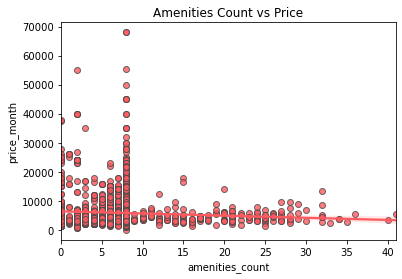

In [7]:
sns.regplot(
        x=df_train['amenities_count'],
        y=df_train['price_month'],
        color=pink,
        scatter_kws = {"edgecolor": light_black}
        )
plt.title('Amenities Count vs Price');

There is no clear correlation between number of amenities and the rental price.

In [8]:
countvec = CountVectorizer(analyzer=lambda x: x)
dtm = countvec.fit_transform(df_train.amenities)

In [9]:
df_eda = pd.DataFrame(dtm.toarray(), columns=countvec.get_feature_names())
# ensure each amenities only count once in each listing
for col in df_eda.columns:
    df_eda[col] = np.where(df_eda[col] > 1, 1, df_eda[col])

#introduce price_month for groupby
df_eda['price_month'] = df_train['price_month'].values

In [10]:
#Amenities with more than 30%.
amenities_weightages = (df_eda.sum() / len(df_eda)*100).sort_values(ascending=False).iloc[1:10]
amenities_weightages

Gym              62.729436
Swimming pool    46.838885
Clubhouse        44.204623
Parking          43.558804
Jacuzzi          43.014956
Security         32.290959
Wading pool      30.931339
Playground       30.013596
Pool deck        20.377294
dtype: float64

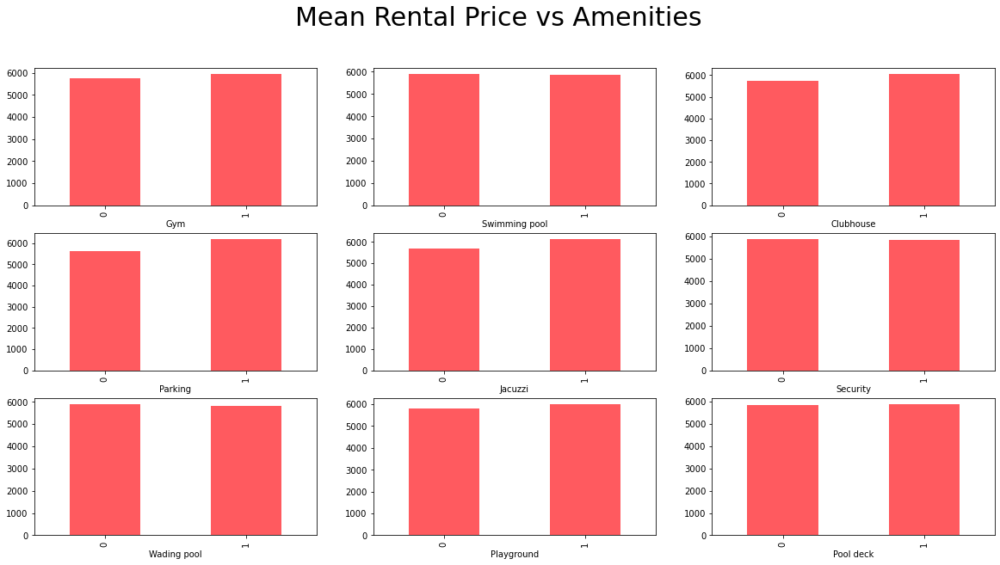

In [11]:
nrows = 3
ncols = 3
index = 0
feature = amenities_weightages.index
fig, ax = plt.subplots(nrows = nrows, ncols= ncols, figsize=(20,10))

for row in range(nrows):
    for col in range(ncols):
        
        #barplot for price
        df_eda.groupby(feature[index])['price_month'].mean().plot.bar(ax=ax[row][col], color=pink)
        index += 1
        
fig.suptitle("Mean Rental Price vs Amenities", fontsize='30');


From above, we can see that for gym, clubhouse , jaccuzi, parking there is a  slight difference in terms of mean price.
we can do a hypothesis test to check if the mean price is significant.

In [12]:
def mean_ttest(feature, a, b, significant_level = 0.05):
    z, p = stats.ttest_ind(a, b)
    if p < significant_level:
        state = 'Null Hypothesis Rejected'
    else:
        state = 'Fail to reject Null Hypothesis'
        
    print('******************************')
    print(feature)
    print(state)
    print('p-value', p)
    return state

Null Hypothesis : there is no difference between the mean price of having/not having the amenities.

Alternate Hypothesis : reject the null hypothesis, there is a difference.

In [13]:
amenities =  []
for amenity in feature:
    no = df_eda.loc[df_eda[amenity] == 0, 'price_month']
    yes = df_eda.loc[df_eda[amenity] == 1, 'price_month']
    state = mean_ttest(amenity, no, yes)
    if state == 'Null Hypothesis Rejected':
        amenities.append(amenity)

******************************
Gym
Fail to reject Null Hypothesis
p-value 0.18265480348560348
******************************
Swimming pool
Fail to reject Null Hypothesis
p-value 0.7667264550868758
******************************
Clubhouse
Null Hypothesis Rejected
p-value 0.009546073119594644
******************************
Parking
Null Hypothesis Rejected
p-value 2.026197814270438e-06
******************************
Jacuzzi
Null Hypothesis Rejected
p-value 0.00019685477144971243
******************************
Security
Fail to reject Null Hypothesis
p-value 0.8754818016988098
******************************
Wading pool
Fail to reject Null Hypothesis
p-value 0.6220560801772175
******************************
Playground
Fail to reject Null Hypothesis
p-value 0.1512360719176622
******************************
Pool deck
Fail to reject Null Hypothesis
p-value 0.9019292513425899


In [14]:
amenities

['Clubhouse', 'Parking', 'Jacuzzi']

**Feature Engineering**: For Amenities, we will one hot encode these as feature which is significant while other amenities as Others

### MRT_Name

### Whether having mrt is signiciant to rental price

In [15]:
df_eda['mrt_availability'] = np.where(df_train['mrt_name'] == 'No_MRT', 0 , 1)

In [16]:
df_eda.groupby('mrt_availability')['price_month'].mean() 

mrt_availability
0    4754.314694
1    6033.087586
Name: price_month, dtype: float64

In [17]:
no = df_eda.loc[df_eda['mrt_availability'] == 0, 'price_month']
yes = df_eda.loc[df_eda['mrt_availability'] == 1, 'price_month']

In [18]:
mean_ttest('mrt_availability', no, yes, significant_level = 0.05)

******************************
mrt_availability
Null Hypothesis Rejected
p-value 8.891133411753108e-14


'Null Hypothesis Rejected'

### Cardinality of MRTs

From above hypothesis test, we find that having nearby MRT is significant to the month rental. We will find need to deal with cardinality of mrt feature as direct onehotencoding will expand the feature space to extreme(might overfit)

In [19]:
def plotcardinality(df, variable, perc):
    plt.figure(figsize=(20,5))
    temp_df = df[variable].value_counts(normalize=True)
    fig = temp_df.sort_values(ascending=False).plot.bar(color='pink')

    # add a line at .5 % to flag the threshold for rare categories
    fig.axhline(y=perc/100, color='blue')
    fig.set_ylabel('Percentage of Mrt')
    return plt

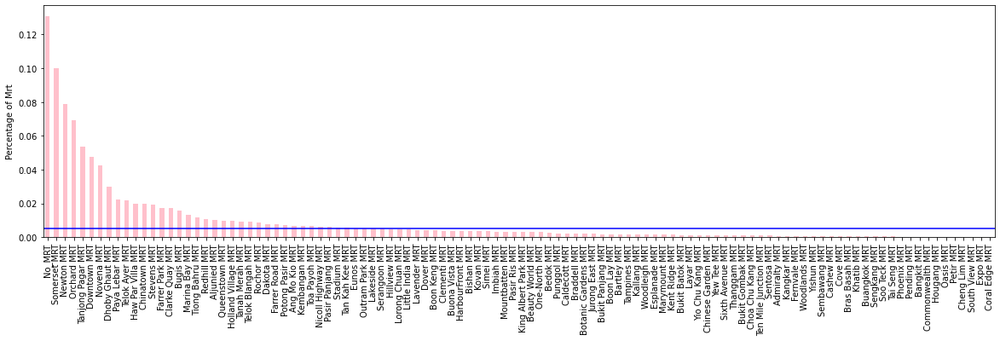

In [20]:
plotcardinality(df_train, 'mrt_name', perc= 0.5);

MRT featuere shows high cardinality. Grouping categories into rare for variables with high cardinality, tends to improve model performance and to smooth model deployment.



In [21]:
rare_encoder = RareLabelEncoder(
    tol=0.005,  # minimal percentage to be considered non-rare
    n_categories=4, # minimal number of categories the variable should have to re-cgroup rare categories
    variables=['mrt_name'], # variables to re-group,
    replace_with='Others'
)

In [22]:
df_temp = rare_encoder.fit_transform(df_train)

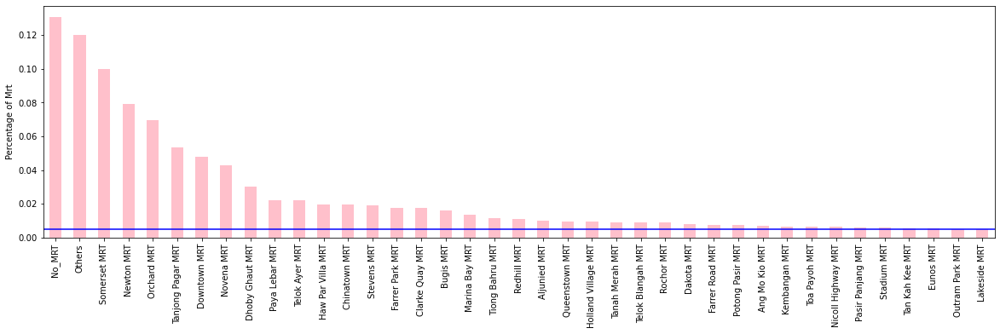

In [23]:
plotcardinality(df_temp, 'mrt_name', perc=0.5);

**Feature Engineering**
1. Use RareLabel to encode MRT with low occurance into rare
2. OneHotEncode all above results

# Building Name

In [24]:
df_train.building_name.unique().shape[0]

1077

In [25]:
# average median price
y_med = df_train.price_month.median()
y_med

4500.0

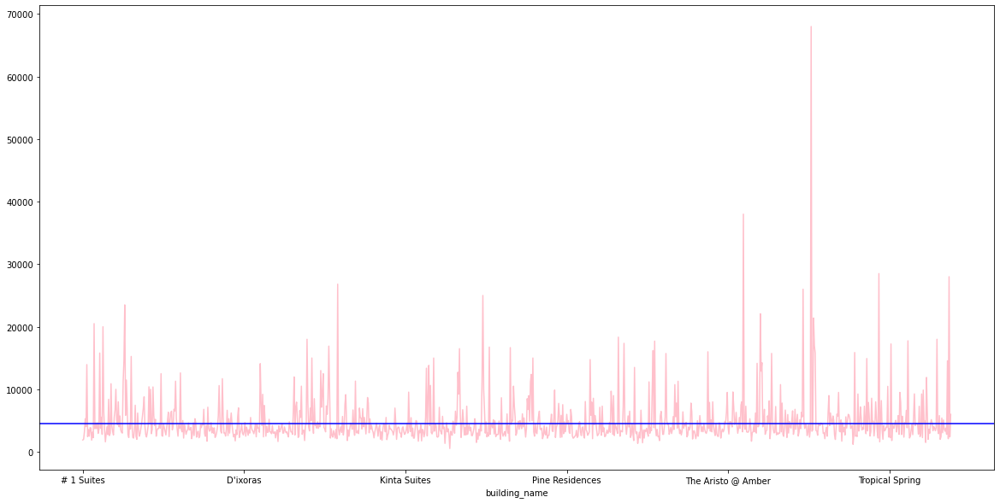

In [26]:
plt.figure(figsize=(20,10))
ax = df_train.groupby(['building_name']).price_month.mean().plot(color='pink')
ax.axhline(y=y_med, color='blue')

Althought building name might gives a good predictive power from above chart. We will not use it for the following reason

1) Building name has extremely high cardinality. With only 5000 training set, this will expand the feature space to 1095 columns if we decide to one hot encode it and this will cause overfit especially using tree-base algorithm

2) Stakeholder requires to input specific buildings to predict the monthly rental which is too specific and not making a general prediction

# District_number

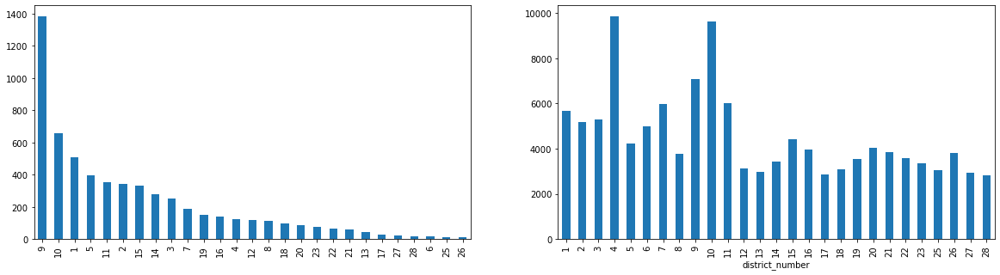

In [27]:
nrows = 1
ncols = 2
fig, ax = plt.subplots(nrows = nrows, ncols= ncols, figsize=(20,5))
df_train.district_number.value_counts().plot.bar(ax=ax[0])
df_train.groupby('district_number')['price_month'].mean().plot.bar(ax=ax[1]);


## Spatial Visual of District with Folium

### Creating Base Map

In [28]:
with open("Data/singapore.geojson") as f:
    gj = geojson.load(f)
    singapore_lat = 1.290270
    singapore_lng = 103.851959
 
    #basemap
    map_singapore = folium.Map(location=(singapore_lat,singapore_lng), zoom_start=11,tiles=None)
    folium.TileLayer('Stamen Terrain',name="Light Map",control=False).add_to(map_singapore)

### Layer-1 Mean Price

In [29]:
# create a dataframe of district number vs rental per month
df_temp = df_train.groupby('district_number')['price_month'].mean().reset_index()

#important must be str type to match geojson
df_temp['district_number']=df_temp['district_number'].astype(str)

#bins for price_month
bins = (df_temp["price_month"].quantile([0, 0.2, 0.4, 0.6, 0.8, 1]))


choropleth = folium.Choropleth(
    geo_data=gj,
    data=df_temp,
    name = 'Mean Rental Price',
    columns=['district_number', 'price_month'],
    key_on='feature.properties.id',
    fill_color="BuPu",
    fill_opacity=0.9,
    line_opacity=1,
    bins = bins,
    legend_name = 'Quantile of Mean Condominium Monthly Rental Price',
    highlight=True,
    show=True,
    nan_fill_color = "black",
    reset=True
    ).add_to(map_singapore)

NIL = folium.features.GeoJsonTooltip(['id'], labels=True)
choropleth.geojson.add_child(NIL)
map_singapore.keep_in_front(NIL)

### Layer-2 Detailed Listing

In [30]:
#creating layer-2
fg = folium.FeatureGroup(name='Detailed Listing', show=True)

#adding marker cluster to the layer
marker_cluster = MarkerCluster().add_to(fg)

for i in range(df_train.shape[0]):
    location = [df_train['lat'].iloc[i],df_train['long'].iloc[i]]   
  
    folium.Marker(location, # adding more details to the popup screen using HTML
                  popup="""
                  <i>Rental per Month: </i> <br> <b>${}</b> <br> 
                  <i>Mean square Feet: </i><b><br>{}</b><br>
                  <i>Mean Built_year: </i><b><br>{}</b><br>""".format(
                    round(df_train['price_month'].iloc[i],2), 
                    round(df_train['sqft'].iloc[i],2), 
                    round(df_train['built_year'].iloc[i],2)), 
                 ).add_to(marker_cluster)

## Layer-3 NeighbhourHood

In [31]:
#adding layer-2 to basemap
map_singapore.add_child(fg)

#creating layer-3
neighbhourhood_fg = folium.FeatureGroup(name='Neighbhourhood', show=False)

for i in range(df_train.shape[0]):
    location = [df_train['lat'].iloc[i],df_train['long'].iloc[i]]
    folium.Circle(location, radius=500, color='blue', fill=False).add_to(neighbhourhood_fg)

map_singapore.add_child(neighbhourhood_fg)

#creating layer control    
folium.LayerControl().add_to(map_singapore)

map_singapore

The spatial correlation is siginifcant as shown in above map. We can encode the *district* feature according to the mean_price. This will create a monotonic relationship with the monthly rental.

**Feature Engineering**: Encode district as TargetedLabelEncoder to create a monotonic relationship with monthly rental. 

# Continuous Data

In [32]:
continuous_variables = ['price_month', 'bedrooms', 'bathrooms', 'sqft', 'walking_time', 'distance']

## Univariate Analysis

In [33]:
def plotdistribution(df, variable, title):
    rows = 2
    cols = 3

    fig, ax = plt.subplots(nrows = rows, ncols = cols, figsize=(16,6))

    index = 0

    for row in range(rows):
        for col in range(cols):
            try:
                sns.histplot(df[variable[index]], ax = ax[row][col], kde=True)
                index += 1
            except:
                continue

    fig.suptitle(title ,fontweight = 'bold')
    plt.tight_layout()

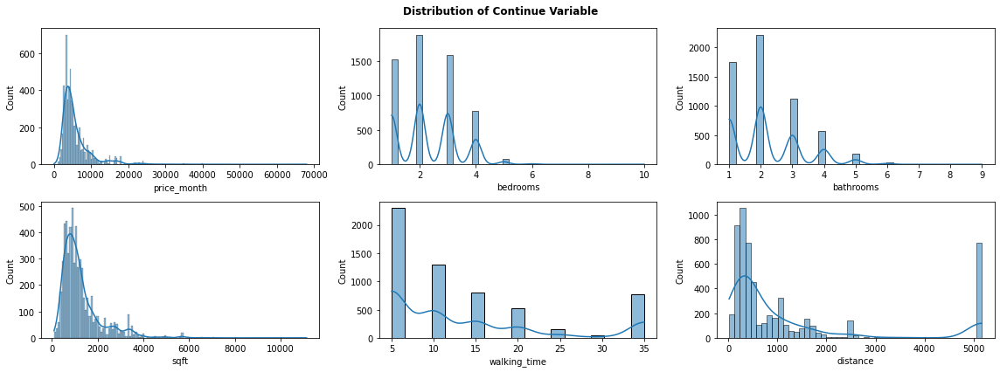

In [34]:
plotdistribution(df_train, continuous_variables, 'Distribution of Continue Variable')

Price & sqft is hightly screwed to the right. If we need to use LinearRegression. We need to transform all features to normal distribution.

### BoxCox Transformer

In [35]:
bct = vt.BoxCoxTransformer(variables = continuous_variables)
df_temp = bct.fit_transform(df_train)

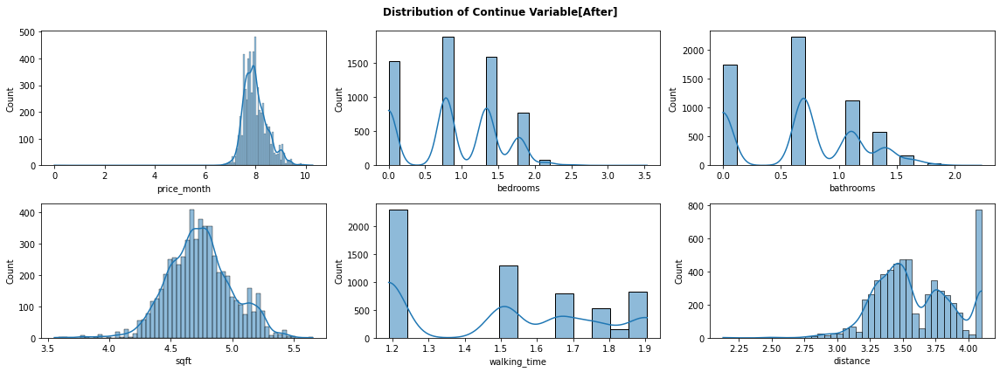

In [36]:
plotdistribution(df_temp, continuous_variables, 'Distribution of Continue Variable[After]')

Using BoxCox transformation, sqrt has been transformed into a normal distribution, however others are not quite as the original distribution is too skewed and impossible to transform into normal distribution

## Multivariate Analysis

### Correlation

In [37]:
variable = ['bedrooms', 'bathrooms', 'sqft', 'walking_time', 'distance', 'district_number', 'studio', 'price_month', 'built_year']

In [38]:
#correlationplot
corr = df_train[variable].corr()

#creating mask for heatmap
M = np.triu(corr)
mask = np.zeros_like(M)
mask[np.triu_indices_from(mask)] = True

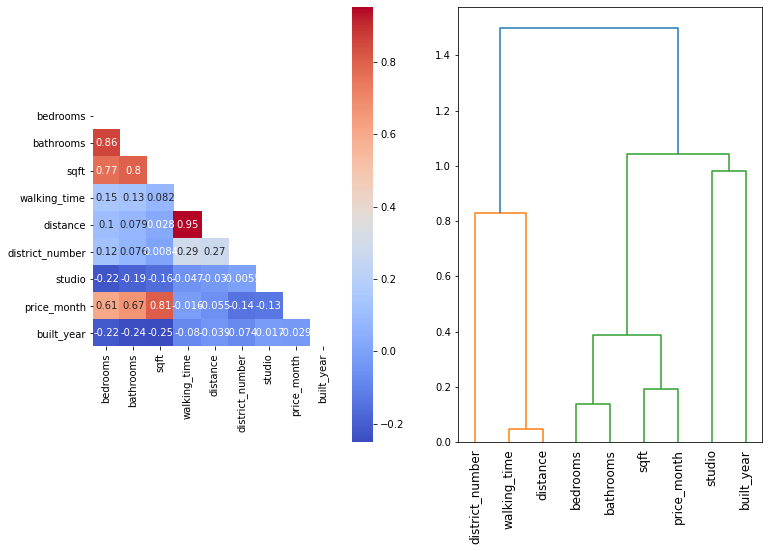

<Figure size 1152x720 with 0 Axes>

In [39]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))

#correlation plot
plt.figure(figsize=(16,10))
sns.heatmap(corr,square=True,annot=True,cmap='coolwarm', mask=mask, ax=ax1);

# We convert the correlation matrix to a distance matrix before performing
# hierarchical clustering using Ward's linkage.
distance_matrix = 1 - np.abs(corr)

dist_linkage = hierarchy.ward(squareform(distance_matrix))
dendro = hierarchy.dendrogram(
    dist_linkage, labels=variable, ax=ax2, leaf_rotation=90
);


From the heat map we can see that the monthly rental price is highly correlated with sizing feature for the continuous variable.
the mrt walking time is slightly negative correlated by it is too small to tell if it is significant.

One of the assumption of Linear Regression is that the feature must be independant. Hence we need to deal with multicolinearity in order to use linear regression. 


As expected, walking_time and distance is highly correlated because it derived from the same feature. We can see that bedrooms, bathrooms & sqrt is highly correlated, we can manually select either the group of **(bedrooms, bathrooms)** or **sqft** for our feature. 

From the dendro tree, we can see that **sqft** will be a better predictor, however it might be less user friendly as compare to bedrooms & bathrooms.

**Feature Selection** : remove studio, combined bedrooms & bathrooms or select sqft, remove distance

### Regression Plot

In [40]:
def plotregressionn(df, variable, title):
    rows = 2
    cols = 3

    fig, ax = plt.subplots(nrows = rows, ncols = cols, figsize=(16,6))

    index = 0

    for row in range(rows):
        for col in range(cols):
            try:
                sns.regplot(x=df[variable[index]], y=df.price_month, ax = ax[row][col], line_kws={"color": "red"})
                index += 1
            except:
                continue

    fig.suptitle(title ,fontweight = 'bold')
    plt.tight_layout()

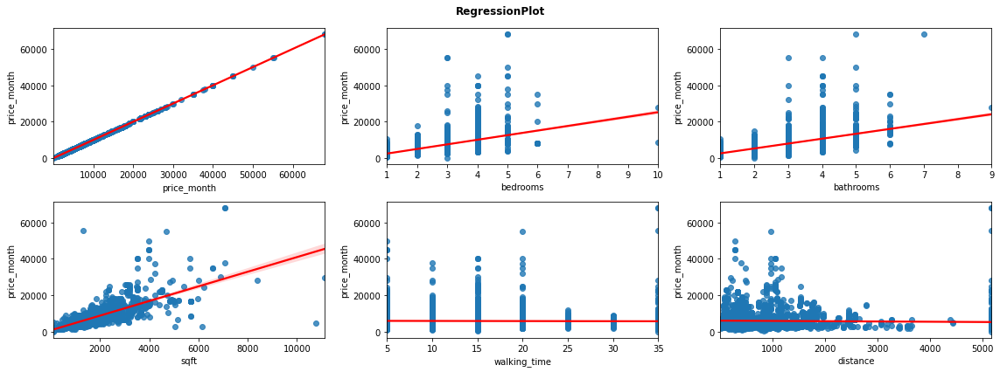

In [41]:
plotregressionn(df_train, continuous_variables, 'RegressionPlot')

As reflected in the colleration plot, we can see that the feature correlation with price. One of the advantage of plotting regression plot is check on  **Anscombe’s Quartet**.

## Summary of EDA

1. We have found that there is no correlation between counts of amenities & rental price.
2. Rental price for having 'clubhouse', 'parking', 'jacuzzi' is significantly difference. We will create a feature using OneHotEncoding technique for this amenities.
3. There is a siginicant in monthly rental of having nearby MRT
4. MRT name has high cardinality. In Feature engineering, we will use Rarelabel encoding technique to group rare MRT occurance under OTHERS.
5. Handling multicolinearity: Select (Walking time, bedrooms & bathrooms) or (Walking time & sqft).
6. For building linear Regression model, we will transform variable to normality by using BoxCoxTransformation.

# References

https://towardsdatascience.com/using-folium-to-generate-choropleth-map-with-customised-tooltips-12e4cec42af2